# Hloubkové senzory - měření objektů
Cvičení je zaměřené na práci s [hloubkovými mapami](https://en.wikipedia.org/wiki/Depth_map) vzniklých použitím tzv. hloubkových senzorů. V laboratoři jsou k dispozici hloubkové senzory založené na několika principech zisku hloubkových map. Jedná se o kamery typu Kinect, RealSense nebo Time-of-Flight (ToF). Souhrně se často označují jako RGBD kamery, kde k standardní barevné informaci RGB přibyde informace hloubková "D" (depth).

Vytvořit stereokameru lze i pomocí dvou obyčejných kamer. Podrobný návod pro zájemce je k dispozici na příklad [zde](https://erget.wordpress.com/2014/02/01/calibrating-a-stereo-camera-with-opencv/).


---

## Typy systémů
<table>
    <tr>
        <th align="left" width="16%"><a href="https://en.wikipedia.org/wiki/Kinect">Microsoft Kinect</a></th>
        <th align="left" width="16%"><img src="images/kinect.png" width="50%"/></th>
        <th align="left" width="16%"><a href="https://en.wikipedia.org/wiki/Intel_RealSense">Intel RealSense</a></th>
        <th align="left" width="16%"><img src="images/realsense.png" width="50%"/></th>
        <th align="left" width="16%"><a href="https://en.wikipedia.org/wiki/Time-of-flight_camera">Basler ToF</a></th>
        <th align="left" width="16%"><img src="images/tof.png" width="50%"/></th>       
    </tr>
    <tr>
        <td align="left" colspan="2">Postaven na principu promítání laserového vzoru a měření jeho deformace infračervenou kamerou.</td>
        <td align="left" colspan="2">Využívá stejného principu jako Kinect, pouze má jiný vzor.</td>
        <td align="left" colspan="2">Využívá promítání světla z více LED zdrojů a měří čas jeho návratu (odrazu).</td>
    </tr>
    <tr>
        <td align="left" colspan="2">Je náchylný na měření venku. Denní světlo kazí obraz.</td>
        <td align="left" colspan="2">Měl by být vhodný i pro měření venku.</td>
        <td align="left" colspan="2">Je náchylný na měření venku. Denní světlo kazí obraz.</td>
    </tr>
    <tr>
        <td align="left" colspan="2">Více Kinectů vedle sebe si vzájemně kazí vzory.</td>
        <td align="left" colspan="2">Nejnovější a nejmenší senzor na trhu.</td>
        <td align="left" colspan="2">Průmyslová konstrukce pro běh 24/7.</td>
    </tr>
</table>

---

## Využití

Kromě zjevného využití RGBD kamer k měření vzdálenosti objektu od senzoru (např. precizní robotická manipulace, 3D skeny, výpočet objemu součástky) jsou kamery užitečné i pro robustnější detekce a klasifikace objektů.

**Příklad:**

Obrázek vlevo nasnímaný RGBD kamerou představuje naměřenou hloubku pomocí barevné škály.
Nelze však jednoduše určit, zda se jedná o jablko nebo pomeranč. Je potřeba použít dodatečnou barevnou informaci.

Naopak samotná 2D kamera by nebyla schopna rozpoznat rozdíl mezi plochou nálepkou ovoce a skutečným hmotným ovocem.

To umožňuje např. detekovat hloubku jablka ve stromu a zároveň jeho zralost dle barvy.

Hloubková informace v synergii s tou barevnou tak poskytuje nové souvislosti v obrazových datech a umožňuje pokročilejší analýzy, nikoliv jen měření vzdáleností.

<img src="images/tof_advantage_showcase.png" alt="RGBD" width="600"/>

---

## Úkol
Cílem cvičení je využít hloubkovou mapu ze senzoru **Basler ToF** pro detekci zkoumaného objektu - zavěšené dřevěné koule mimikující jablko. Dále je potřeba vyfiltrovat dřevěnou krychli, kterou měřit nechceme a výstup vhodně vizualizovat.

Úloha je inspirovaná řešením z aplikovaného výzkumu samosběrného robota [[1]](https://robomechjournal.springeropen.com/articles/10.1186/s40648-022-00230-y):

<table>
    <tr>
        <td><img src="images/fruit_picking_robot.png" alt="Fruit picking robot" height="260"/></td>
        <td><img src="images/pears_3D.png" alt="Pears 3D" height="260"/></td>
        <td><img src="images/robot_action.png" alt="Robot in action" height="260"/></td>
    </tr>
</table>


---

### Import knihoven a konfigurace

In [1]:
import os
import io
import builtins


import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patheffects import withStroke

from improutils import *

%matplotlib inline
np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})

---

#### 1) Nasnímejte data hloubkovou kamerou Basler ToF

Pro práci s hloubkovou kamerou využijte software Basler ToF Viewer. Kameru připojte k PC, nasnímejte zkoumaný objekt a výstup uložte. Typ souboru při ukládání vyberte jako "Points intensity" (končí příponou points-intensity.pcd).

Dbejte na to, aby při pořizování dat byla kamera **nastavena rovnoběžně s pozadím**, a to bez rušivých elementů v záběru, např. okraj monitoru apod. 

Usnadnit snímání Vám může nastavení "Maximum depth [mm]" v programu, který vyfiltruje vše, co je dále, než zvolený threshold.

---

#### 2) Načtěte data ve formátu point cloud `.pcd (text)` a z dat získejte hloubkovou mapu. Mapu zobrazte.

##### a) Zobrazte strukturu .pcd dat

In [3]:
with builtins.open("./images/jabka2-0003-points_intensity.pcd", 'r') as f:  ### soubor s pcd daty
    pcd = f.readlines()

header = pcd[:11]
data = pcd[11:]

for line in header : # zobrazení hlavičky
    print(line)

for line in data : # zobrazení několika bodů
    print(line)

# .PCD v0.7 - Point Cloud Data file format

VERSION 0.7

FIELDS x y z rgb

SIZE 4 4 4 4

TYPE F F F F

COUNT 1 1 1 1

WIDTH 640

HEIGHT 480

VIEWPOINT 0 0 0 0 -1 0 0

POINTS 307200

DATA ascii

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

-169.2094 115.86385 -664.38843 nan

-168.08653 115.80651 -664.04553 nan

-167.0621 115.81666 -664.08972 nan

-165.74554 115.62312 -662.966 nan

-164.67354 115.59881 -662.8125 nan

-163.8898 115.77782 -663.82483 nan

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

-198.62898 110.26794 -662.31647 nan

-197.7937 110.38036 -662.97729 nan

-196.61346 110.30044 -662.48279 nan

-195.26378 110.12408 -661.40912 nan

-193.80367 109.88321 -659.94812 nan

-192.40363 109.674 -658.67719 nan

-191.00684 109.46437 -657.40387 nan

-189.66904 109.28645 -656.32111 nan

-188.66664 109.30


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

-198.22162 104.88705 -660.95129 nan

-197.44601 105.02491 -661.80518 nan

-196.26736 104.94869 -661.31 nan

-194.91902 104.78044 -660.23492 nan

-193.34692 104.48944 -658.38647 nan

-191.77974 104.19798 -656.53522 nan

-190.38567 103.99792 -655.26001 nan

-189.16222 103.8894 -654.56146 nan

-188.38445 104.025


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

126.1907 80.658585 -541.45245 nan

126.2607 80.166245 -538.13477 nan

127.06038 80.140663 -537.95032 nan

127.53354 79.910835 -536.39502 nan

128.1891 79.797569 -535.62207 nan

128.88921 79.713341 -535.04413 nan

129.44514 79.541618 -533.87891 nan

130.23579 79.515419 -533.69049 nan

130.92966 79.430855 -533.


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

-28.229317 72.014938 -720.65088 -2.8490307e+38

-27.180286 72.223412 -722.71442 -2.662209e+38

-26.095591 72.35096 -723.96802 -2.6221758e+38

-24.972054 72.377357 -724.20941 -2.6355202e+38

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

-199.77489 55.524158 -662.61841 nan

-198.82639 55.549877 -662.90149 nan

-197.64493 55.510433 -662.40686 nan

-196.52211 55.48711 -662.10474 nan

-195.39977 55.46365 -661.80103 nan

-194.22078 55.423763 -661.30127 nan

-193.09962 55.400024 -660.99426 nan

-191.97897 55.376148 -660.68561 nan

-190.85878 55.352139 -660.37537 nan

-189.73909 55.327988 -660.06348 nan

-188.73125 55.336357 -660.13959 nan

-187.6674 55.328285 -660.01953 nan

-186.60349 55.320087 -659.89795 na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

-40.83007 53.144745 -724.74683 -2.5821426e+38

-39.567394 52.973331 -722.38025 -2.6221758e+38

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

-22.110022 41.442791 -564.91528 nan

-21.090961 41.179413 -561.30267 nan

-20.24361 41.242859 -562.1449 nan

-19.442419 41.410263 -564.40405 nan

-18.587479 41.473545 -565.24384 nan

-17.812349 41.729992 -568.71619 nan

-17.062494 42.075596 -573.4032 nan

-16.315077 42.465763 -578.69714 nan

-15.545667 42.841022 -583.78754 nan

-14.592682 42.725483 -582.1897 nan

-13.616072 42.520584 -579.37445 nan

-12.674891 42.404789 -577.77356 nan

-11.738673 42.288879 -576.17114 nan

-10.769304 42.02409 -572.54053 nan

-9.8357172 41.8633 -570.32703 nan

-8.9312658 41.80653 -569.53082 nan

-8.0464411 41.838924 -569.94922 nan

-7.1729994 41.945618 -571.37976 nan

nan nan


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

-199.70229 45.162273 -662.36346 nan

-198.52115 45.13055 -661.87 nan

-197.51498 45.138462 -661.95789 nan

-196.45044 45.13303 -661.85004 nan

-195.21349 45.0877 -661.15723 nan

-194.03529 45.055508 -660.65704 nan

-192.85809 45.02319 -660.15509 nan

-191.51216 44.950901 -659.06702 nan

-189.83109 44.79871 -656.80774 nan

-188.49229 44.726063 -655.71478 nan

-187.21201 44.666557 -654.81445 nan

-185.93393 44.606903 -653.91211 nan

-184.71326 44.560413 -653.20288 nan

-183.54912 44.527107 -652.68689 nan

-182.4407 44.507008 -652.36444 nan

-181.33284 44.48679 -652.04041 nan

-180.22552 44.466465 -651.71478 nan

-179.17253 44.459362 -651.58301 nan

-178.11954 44.452164 -651.44983 nan

-177.17296 44.471581 -

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

-199.15823 42.753269 -657.15649 nan

-198.21848 42.773556 -657.43927 nan

-197.33577 42.806416 -657.91522 nan

-196.39326 42.826569 -658.19586 nan

-195.44958 42.846657 -658.4754 nan

-194.38976 42.841347 -658.36475 nan

-193.38702 42.84861 -658.44727 nan

-192.32675 42.843124 -658.3338 nan

-191.20979 42.824856 -658.02405 nan

-189.98068 42.78112 -657.323 nan

-188.80922 42.749947 -656.81494 nan

-187.58305 42.705956 -656.11005 nan

-186.30304 42.649136 -655.20813 nan

-184.97005 42.579468 -654.10889 nan

-183.69475 42.522358 -653.20276 nan

-182.47632 42.477825 -652.48981 nan

-181.36826 42.458611 -652.16577 nan

-180.20665 42.426

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

-25.737585 33.908905 -587.47864 nan

-24.820595 33.91283 -587.51788 nan

-23.746693 33.694305 -583.70349 nan

-22.771883 33.604404 -582.11761 nan

-21.862877 33.608051 -582.15222 nan

-20.931805 33.576492 -581.57715 nan

-19.960579 33.474594 -579.78375 nan

-18.961569 33.314045 -576.97479 nan

-17.952234 33.118248 -573.55573 nan

-16.959562 32.934048 -570.33771 nan

-15.988321 32.773159 -567.52368 nan

-15.063606 32.694157 -566.12793 nan

-14.117805 32.556484 -563.71643 nan

-13.103289 32.231251 -558.05768 nan

-12.119759 31.941032 -553.00574 nan

-11.308881 32.095982 -555.66113 nan

-10.432485 32.075085 -555.27228 nan

-9.6131811 32.241627 -558.12811 nan

-8.9119987 32.876953 -569.09821 nan

-8.0248985 32.891041 -569.31421 nan

-7.1320062 32.881607 -569.12305 nan


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


-12.572412 28.662813 -573.93872 nan

-11.687473 28.695753 -574.56641 nan

-10.712877 28.495472 -570.5246 nan

-9.7229347 28.213984 -564.85748 nan

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

-2.7499733 29.244711 -585.23352 nan

-1.835097 29.256651 -585.44006 nan

-0.91796523 29.217796 -584.63013 nan

-0.0033571937 29.209301 -584.42773 nan

0.91157824 29.231173 -584.83301 nan

1.8271565 29.242826 -585.03375 nan

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

-196.11761 26.066717 -650.44916 nan

-195.47847 26.118652 -651.70129 nan

-194.71918 26.15498 -652.5639 nan

-193.7836 26.167877 -652.8418 nan

-192.73181 26.165113 -652.72906 nan

-191.794

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

-18.891354 21.522358 -575.29871 nan

-17.973392 21.502186 -574.71838 nan

-17.063221 21.489553 -574.3396 nan

-16.159897 21.484461 -574.16248 nan

-15.311047 21.555294 -576.01422 nan

-14.476673 21.656485 -578.677 nan

-13.61012 21.719648 -580.32324 nan

-12.71615 21.744768 -580.95288 nan

-11.774771 21.686226 -579.34741 nan

-10.86885 21.688437 -579.36505 nan

-9.9523582 21.667784 -578.77203 nan

-9.0345125 21.639473 -577.97449 nan

-8.1305552 21.64152 -577.98779 nan

-7.2392206 21.681538 -579.0152 nan

-6.3357582 21.69109 -579.22888 nan

-5.4258876 21.677767 -578.83179 nan

-4.5315104 21.732855 -580.26123 nan

nan nan nan 0

nan nan nan 0

nan nan nan 0

-0.90344685 21.815784 -582.30902 nan

0.0076460293 21.946733 -585.76251 nan

0.92090541 21.872169 -583.73065 nan

1.8424944 21.972589 -586.36884 nan

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

-185.22855 -24.773645 -651.35803 nan

-184.28716 -24.78241 -651.62463 nan

-183.34457 -24.79113 -651.89014 nan

-182.45555 -24.807245 -652.35016 nan

-181.40152 -24.800997 -652.22211 nan

-180.23917 -24.779808 -651.70099 nan

-179.13181 -24.765997 -651.37396 nan

-177.91786 -24.737228 -650.6535 nan

-176.81219 -24.723293 -650.32306 nan

-175.86613 -24.731657 -650.57922 nan

-174.91891 -24.739977 -650.83417 nan

-173.9706 -24.748251 -651.08807 nan

-172.91684 -24.741554 -650.94806 nan

-171.91499 -24.742268 -651.00299 nan

-171.06732 -24.765327 -651.64594 nan

-170.11482 -24.773415 -651.89496 nan

-169.2122 -24.788923 -652.33936 nan

-168.30792 -24.804392 -652.78271 nan

-167.40198 -24.819818 -653.22498 nan

-166.89542 -24.895029 -655.24084 nan

-166.13336 -24.932829 -656.27228 nan

-165.16968 -24.940672 -656.5152 nan

-164.20491 -24.948465 -656.75684 nan

-163.14111 -24.941235 -656.60303 nan

-162.02872 -24.926458 -656.25049 nan

-160.86861 -24.904127 -655.6991 nan

-159.75786 -24.8892


-188.31053 -27.987387 -655.00122 nan

-187.47705 -28.014271 -655.66229 nan

-186.58569 -28.032774 -656.1272 nan

-185.63736 -28.042883 -656.39569 nan

-184.74281 -28.061295 -656.85852 nan

-183.51833 -28.029531 -656.14697 nan

-182.18668 -27.980976 -655.04218 nan

-180.8037 -27.923967 -653.73938 nan

-179.42412 -27.866859 -652.43414 nan

-178.10149 -27.818024 -651.32239 nan

-176.72842 -27.760723 -650.01245 nan

-175.46478 -27.720072 -649.09216 nan

-174.41428 -27.712833 -648.95422 nan

-173.41621 -27.713913 -649.01111 nan

-172.52188 -27.731693 -649.45911 nan

-171.6777 -27.757814 -650.10248 nan

-170.47032 -27.725191 -649.36993 nan

-169.46983 -27.726044 -649.42151 nan

-168.62177 -27.752012 -650.06146 nan

-167.82217 -27.786337 -650.89709 nan

-166.8685 -27.795431 -651.14191 nan

-166.21451 -27.854876 -652.56616 nan

-165.55595 -27.914301 -653.99011 nan

-164.59558 -27.923269 -654.23212 nan

-163.97893 -27.991043 -655.85199 nan

-163.06334 -28.008335 -656.28906 nan

-162.09741 -28.


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

-184.22803 -45.147514 -651.39459 nan

-183.01083 -45.096981 -650.68317 nan

-181.79532 -45.046318 -649.96973 nan

-180.69016 -45.022602 -649.6452 nan

-179.63959 -45.012325 -649.51453 nan

-178.58902 -45.001945 -649.38232 nan

-177.59196 -45.005024 -649.44434 nan

-176.64752 -45.021568 -649.70068 nan

-175.75487 -45.051594 -650.15167 nan

-174.80792 -45.067982 -650.40582 nan

-173.91217 -45.097862 -650.85468 nan

-173.06679 -45.141251 -651.49854 nan

-172.21918 -45.184574 -652.14148 nan

-171.42078 -45.241425 -652.97974 nan

-170.46596 -45.257435 -653.22852 nan

-169.51003 -45.273365 -653.47614 nan

-168.40108 -45.24839 -653.13342 nan

-167.24245 -45.209698 -652.59259 nan

-166.13506 -45.184498 -652.24652 nan

-165.12787 -45.18642 -652.29199 nan

-164.02122 -45.160999 -651.94275 nan

-162.86606 -45.121841 -651.39508 nan

-161.76103 -45.096191 -651.04248 nan

-160.60808 -45.056793 -650.49133 nan

-159.5047 -45.03091 -650.13531 nan

-158.30597 -44.977623 -649.38361 nan

-156.72717 -44.81


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

-195.0433

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

-182.76068 -72.673164 -660.77484 nan

-181.8542 -72.722336 -661.23151 nan

-180.946 -72.7714 -661.68707 nan

-180.2482 -72.906151 -662.92181 nan

-178.70248 -72.697533 -661.03436 nan

-177.63405 -72.681786 -660.9007 nan

-175.10464 -72.064636 -655.29828 nan

-174.14798 -72.091309 -655.55017 nan

-171.95163 -71.602112 -651.11108 nan

-170.89696 -71.585342 -650.9679 nan

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

-47.42474 -80.931465 -707.00928 nan

-46.177738 -80.684914 -704.86499 nan

-44.292942 -79.284729 -692.64227 nan

-43.074783 -79.037605 -690.49268 nan

-42.083858 -79.205551 -691.96924 nan

-41.064335 -79.327179 -693.04126 nan

-40.02972 -79.425568 -693.91016 nan

-38.890446 -79.316086 -692.96301 nan

-37.754021 -79.206398 -692.01398 nan

-36.406738 -78.634895 -687.03015 nan

-35.116398 -78.155449 -682.85052 nan

-33.919464 -77.860428 -680.28204 nan

-33.139584 -78.534737 -686.18286 nan

-31.822742 -77.939201 -680.98871 nan

-30.585814 -77.50502 -677.20422 nan

-29.589315 -7


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

-51.506702 -109.07636 -702.72375 nan

-50.110455 -108.4345 -698.59418 nan

-49.148697

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

-42.627171 -126.46857 -720.2533 nan

-41.295792 -125.84731 -716.71954 nan

-39.706444 -124.38331 -708.38623 nan

nan nan nan 0

nan nan nan 0

-35.011799 -119.70737 -681.76862


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan na


nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan nan 0

nan nan n

##### b) Převeďte .pcd data na hloubkovou mapu

Informace v hlavičce .pcd souboru vám mimo jiné prozradila, že data jsou ve formátu 4 float hodnot x, y, z, rgb. Při pořizování dat byla kamera nastavena rovnoběžně s pozadím, tudíž nás budou zajímat pouze **_z_** hodnoty -> hloubková mapa.

Souřadnice ```z = 0``` je dle výrobce na přední straně krytu kamery a od ní dále se měří vzdálenost. Pixely s nespolehlivými údaji o vzdálenosti (např. poblíž hran objektů) nebo pixely, které představují objekty v oblastech mimo ROI (vámi nastavená maximální hloubka), mají hodnotu NaN.

In [5]:
# Funkce pro převod .pcd dat do hloubkové mapy o velikosti height x width
def pcd_to_depth(pcd, height, width):
    data = pcd
    data = [float(x.split(' ')[2]) for x in data] # extrakce hloubkové hodnoty
    data = np.reshape(data, (height, width))
    return data

In [6]:
depths = pcd_to_depth(data,480,640)  ###

##### c) Normalizujte a zobrazte data
Pro využití automatické segmentace je třeba data převézt na typ uint8. Pro převedení dat do rozsahu [0, 255] je třeba použít normalizaci, OpenCV a improutils obsahují vhodnou funkci.

Normalizovaná data zobrazte pomocí čtyř různých [colormap](https://matplotlib.org/stable/users/explain/colors/colormaps.html), vhodných pro hloubková data.

In [7]:
def subplot_image(image, subplots=(2, 2), cmaps=['gray'], normalize=False, ticks_off=True, title_size=12):
    """
    Plots the same image in multiple subplots with different color maps.

    Parameters
    ----------
    image : ndarray
        Image to be shown.
    subplots : tuple
        Shape of the subplot grid (rows, columns).
    cmaps : list
        List of colormaps to be used for each subplot.
    normalize : bool
        If True, image will be normalized.
    ticks_off : bool
        If True, axis decorations will be hidden.
    title_size : int
        Size of the title.

    Returns
    -------
    None
    """
    rows, cols = subplots
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 6, rows * 6))
    
    # Flatten axes array if it's 2D for easier iteration
    axes = axes.ravel()

    # Determine number of subplots and iterate
    num_subplots = min(len(axes), len(cmaps))
    for i in range(num_subplots):
        ax = axes[i]
        if ticks_off:
            ax.axis('off')

        # Set colormap and display the image
        cmap = cmaps[i] if i < len(cmaps) else 'gray'
        norm = Normalize() if normalize else NoNorm()
        
        ax.imshow(image, cmap=plt.get_cmap(cmap), norm=norm)
        ax.set_title(f'Cmap: {cmap}', fontsize=title_size)

    # Hide any unused subplots if there are fewer cmaps than grid cells
    for j in range(num_subplots, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

In [8]:
depths_normalized = cv2.normalize(depths, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U) ### normalizace dat

In [9]:
depths_normalized = normalize(depths) ### normalizace dat

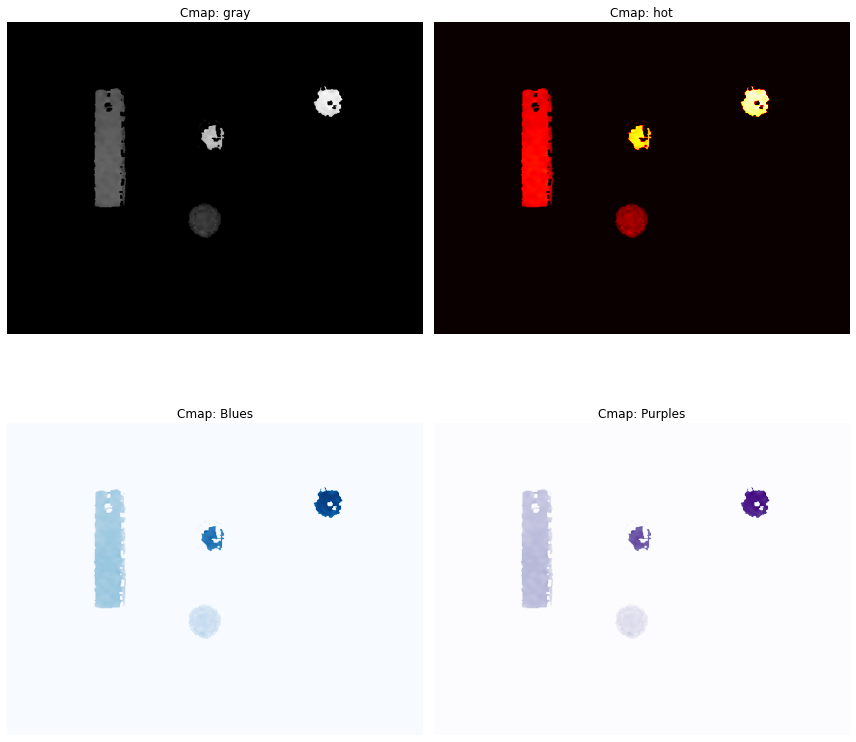

In [10]:
subplot_image(depths_normalized, subplots=(2, 2), cmaps=['gray', 'hot', 'Blues', 'Purples' ]) ### zobrazení s různými colormapy

#### 3) Segmentujte objekty
Při použití klasické segmentace není vhodné segmentovat normalizovaná data, jelikož by segmentace nebyla založena na reálných datech. Funkce pro automatické segmentování v improutils používá *Otsouvu metodu*, která u originálních a normalizovaných bude segmentovat stejně. 

Využijte **automatickou** segmentaci na **normalizovaných** datech a **manuální** pro **originální** i **normalizovaná** data. Výsledné 3 masky zobrazte.

Pro volbu vhodných hodnot při manuální segmentaci originálních hodnot si můžete pomoci např. matplotlib histogramem (pozor na NaN hodnoty) či podstatou, jaká data hloubková kamera zaznamenává.

Dále pracujte jen s nejlepším segmentace.

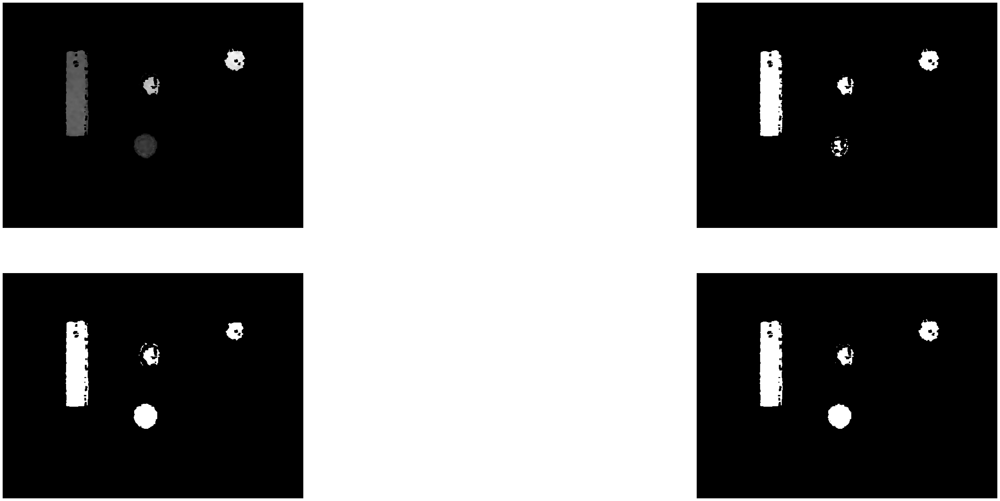

In [113]:
img_seg_auto = segmentation_auto_threshold(depths_normalized) ###
img_seg_org = segmentation_two_thresholds(depths,-500, -800) ###
img_seg_norm = negative(segmentation_two_thresholds(depths_normalized, 0.5,22)) ###
plot_images(depths_normalized, img_seg_auto, img_seg_org, img_seg_norm) # porovnejte normalizovaný a segmentovaný obraz

---

#### 4) Získejte masku naměřených objektů

Pro měření objektů je třeba získat kontury objektů. Počet kontur by měl odpovídat počtu zavěšených objektů. Filtrací odstraníme nekruhové objekty a šum. 

Kontury vyfiltrujte minimální plochou a na základě jejich kulatosti.
Kulatost je definována vzorcem $\dfrac{4 * \pi * plocha}{obvod^2}$ [[2]](https://en.wikipedia.org/wiki/Roundness). Pro některé výpočty týkajících se vlastností kontury budete muset použít vhodné funkce z OpenCV2 či improutils.

Zobrazte novou masku na základě vyfiltrovaných kontur. Pro hledání kontur využijte jednu ze 3 vytvořených masek.



In [114]:
min_area, max_area = 100, 100000
contour_drawn, count, contours = find_contours(img_seg_org, min_area, max_area) ###
print(f"Počet nalezených kontur: {count}")

Počet nalezených kontur: 4


Kontura 0: Plocha = 1948.50, Obvod = 179.78, Kulatost = 0.7576, Přijímáme = ANO
Kontura 1: Plocha = 773.00, Obvod = 164.23, Kulatost = 0.3602, Přijímáme = ANO
Kontura 2: Plocha = 979.00, Obvod = 135.05, Kulatost = 0.6745, Přijímáme = ANO
Kontura 3: Plocha = 7807.50, Obvod = 526.55, Kulatost = 0.3539, Přijímáme = NE


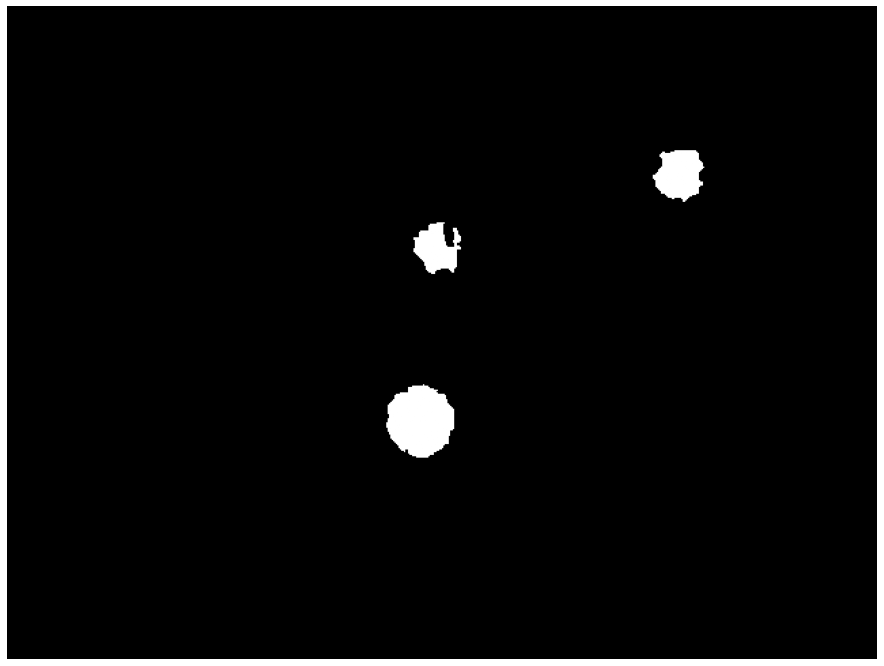

In [128]:
filtered_image = np.zeros_like(img_seg_org)  # prázdný obraz pro zápis přijatých kontur
passed_contours = []

# Filtrování kontur na základě jejich kulatosti
for i, c in enumerate(contours):
    area = cv2.contourArea(c)      # obsah kontury
    perimeter = cv2.arcLength(c,True)  # obvod kontury
    
    circularity = (4 * np.pi * area) / perimeter**2 # porovnání kulatosti kontury a ideálního kruhu
    
    accept = "NE" # flag pro výpis
    
    if 0.36 < circularity < 1.5: # doplňte vhodné hodnoty pro odfiltrování nekulatých objektů 
       
        accept = "ANO"
        passed_contours.append(c)
        
    
    print(f"Kontura {i}: Plocha = {area:.2f}, Obvod = {perimeter:.2f}, Kulatost = {circularity:.4f}, Přijímáme = {accept}")

cv2.drawContours(filtered_image, passed_contours,  -1, (255,0,0), -1) # vykreslení všech přijatých kontur do jednoho obrazu   
plot_images(filtered_image)

---

#### 5) Slučte hloubkovou informaci s maskou vyfiltrovaných jablek
OpenCV obsahuje vhodnou funkci pro logické sloučení dvou obrazů. Výsledek vizualizujte pomocí vhodné colormapy.

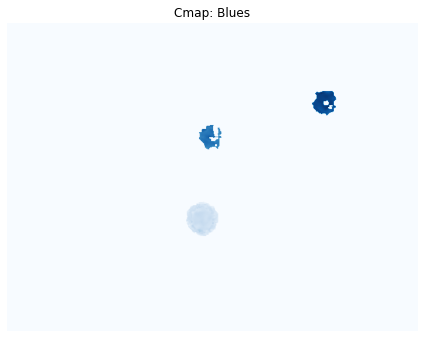

In [130]:
ball_depth = cv2.bitwise_and(depths_normalized, filtered_image) #
subplot_image(ball_depth, subplots=(2,1), cmaps=["Blues"])

---

#### 6) Nalezněte koule, které jsou nejdále a nejblíže od kamery

##### a) Vizualizujte indexy přijatých kontur (koulí) na hloubkovém obrazu z předchozího kroku

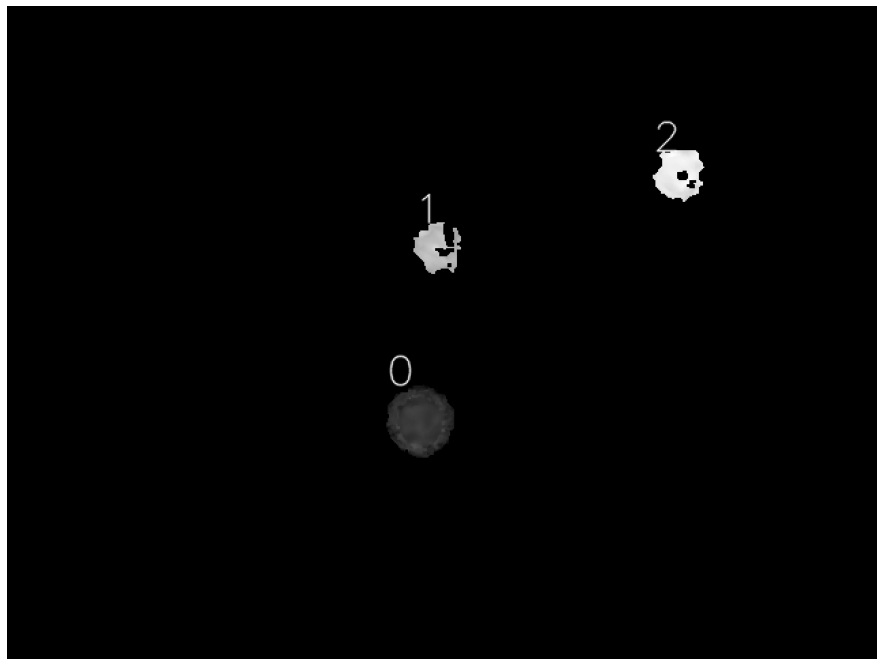

In [132]:
number_contours_img = ball_depth.copy()
for i, contour in enumerate(passed_contours):
    x, y, w, h = cv2.boundingRect(contour)  # vhodná funkce cv2 na obdélníkové ohraničení kontury
    number_contours_img = cv2.putText(number_contours_img, str(i) , (x, y), cv2.FONT_HERSHEY_SIMPLEX, 1, 255, 1, cv2.LINE_AA)
 
plot_images(number_contours_img) ###

##### b) Vypište index koule visící nejblíže a nejdále od kamery
Nezapomeňte správně pracovat s NaN hodnotami.

In [ ]:
results = []

for contour in passed_contours:
    
    contour_mask = np.zeros(..., dtype=np.uint8) # příprava masky pro aplikaci na originální data
    contour_mask = cv2.drawContours(..., [...], -1, 255, -1) # vykreslení kontury do masky
    
    ... ### aplikace masky, výběr nejbližšího bodu a uložení
    
min_depth_index = ...
max_depth_index = ...

print('Nejblíže ke kameře je koule:  č.{}'.format(max_depth_index))
print('Nejdál ke kameře je koule:  č.{}'.format(min_depth_index))
    